# EX16. 흐린 사진을 선명하게

***********************
  
> - 평가문항
  
> - 1) SRGAN을 이용해 고해상도의 이미지를 생성하였다.
      
> - 2) 다양한 해상도의 이미지에 대해 시각화를 통해 원본, SRGAN생성본, interpolation생성본을 비교분석하였다.
      
> - 3) 저해상도 gif 동영상을 고해상도 동영상으로 성공적으로 변환하였다.
  
  
  
  *********************


- SRSNN

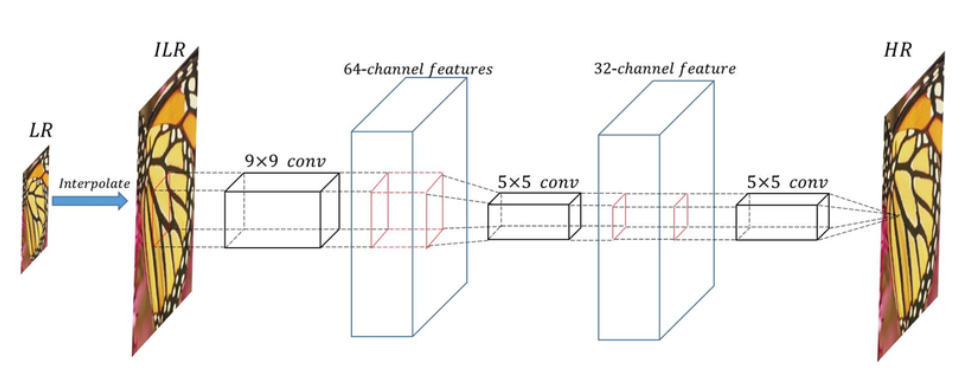

### 1) Patch extraction and representation : 저해상도 이미지에서 patch를 추출한다.

### 2) Non-linear mapping : Patch를 다른 차원의 patch로 비선형 매핑한다.

### 3) Reconstruction : Patch로부터 고해상도 이미지를 생성한다.

*************************
## 프로젝트 1-1

In [101]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import tensorflow_datasets as tfds
from PIL import Image

(480, 777, 3)


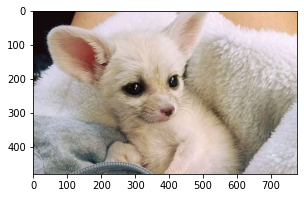

In [102]:
# 고해상도 이미지 불러오기
hr_image = cv2.imread(os.getenv('HOME') + '/aiffel/super_resolution/fox.JPG')
hr_image = cv2.cvtColor(hr_image, cv2.COLOR_BGR2RGB)

print(hr_image.shape)

plt.figure(figsize=(6,3))
plt.imshow(hr_image)

(120, 194, 3)


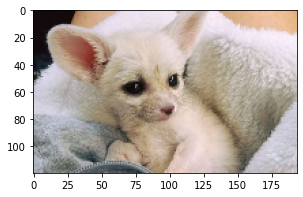

In [104]:
# 이미지 픽셀 수 줄이기 (1/4)
lr_image = cv2.resize(
    hr_image,
    dsize=(hr_image.shape[1]//4, hr_image.shape[0]//4)
)

print(lr_image.shape)

plt.figure(figsize=(6,3))
plt.imshow(lr_image)

### SRGAN 학습

In [105]:
# pre-trained 모델 로드
model_file = os.getenv('HOME')+'/aiffel/super_resolution/srgan_G.h5'
srgan = tf.keras.models.load_model(model_file)

In [106]:
# SRGAN으로 고해상도 이미지 생성
def apply_srgan(image):
    image = tf.cast(image[np.newaxis, ...], tf.float32)
    sr = srgan.predict(image)
    sr = tf.clip_by_value(sr, 0, 255)  # 텐서 값을 지정된 최소값과 최대값으로 자릅니다.
    sr = tf.round(sr)
    sr = tf.cast(sr, tf.uint8)
    return np.array(sr)[0]

train, valid = tfds.load(
    "div2k/bicubic_x4", 
    split=["train","validation"],
    as_supervised=True      # as_supervised=True 옵션을 주면 dict 형태가 아닌 tuple 형태로 데이터를 return 받습니다.
)

for i, (lr, hr) in enumerate(valid):
    if i == 6: break

srgan_hr = apply_srgan(lr_image)

In [107]:
# bicubic interpolation으로 이미지 사이즈 키우기
bicubic_hr = cv2.resize(
    lr_image, 
    dsize=(hr_image.shape[1], hr_image.shape[0]), # 고해상도 이미지 크기로 설정
    interpolation=cv2.INTER_CUBIC # bicubic 설정
)

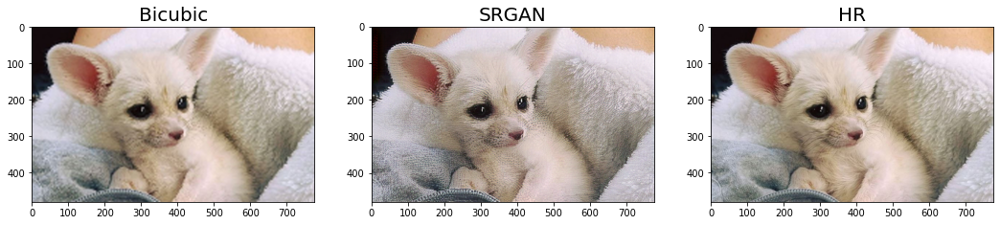

In [108]:
# 시각화
images = [bicubic_hr, srgan_hr, hr_image]
titles = ["Bicubic", "SRGAN", "HR"]

plt.figure(figsize=(18,5))
for i, (image, title) in enumerate(zip(images, titles)):
    plt.subplot(1,3,i+1)
    plt.imshow(image)
    plt.title(title, fontsize=20)

- 전체로 봤을때는 비교가 쉽지않아, 특정 부분 비교

In [109]:
# 특정 영역을 잘라낼 함수를 정의합니다.
def crop(image, left_top, x=50, y=100):
    return image[left_top[0]:(left_top[0]+x), left_top[1]:(left_top[1]+y), :]

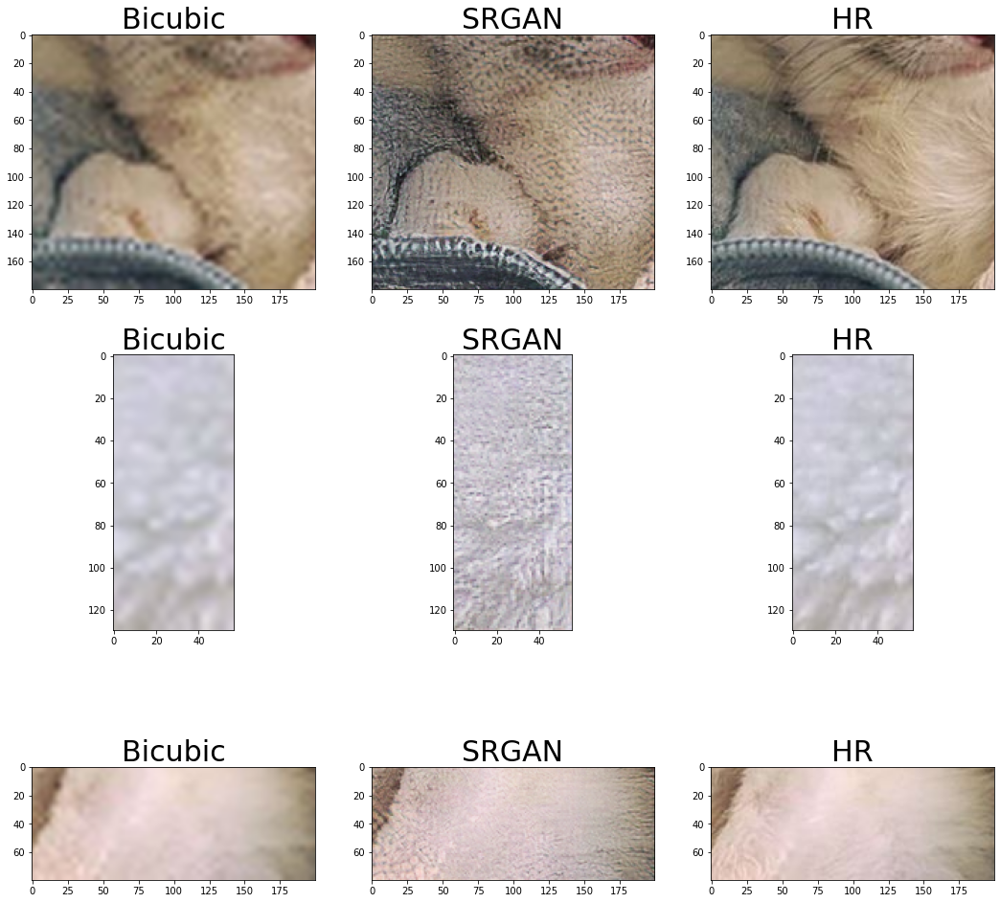

In [110]:
# 자세히 시각화 하기 위해 3개 영역을 잘라냅니다.
# 아래는 잘라낸 부분의 좌상단 좌표 3개 입니다.
left_tops = [(300,200), (350,720), (400,400)]

images = []
for left_top in left_tops:
    img1 = crop(bicubic_hr, left_top, 200, 200)
    img2 = crop(srgan_hr , left_top, 200, 200)
    img3 = crop(hr_image, left_top, 200, 200)
    images.extend([img1, img2, img3])

labels = ["Bicubic", "SRGAN", "HR"] * 3

plt.figure(figsize=(18,18))
for i in range(9):
    plt.subplot(3,3,i+1) 
    plt.imshow(images[i])
    plt.title(labels[i], fontsize=30)

- Bicubic는 조금 흐리게 나왔고, srgan은 비교적 선명하기는 하지만, HR(원래 이미지)에 비해서는 질감이 다소 어색하다.

****************
## 프로젝트 1-2

- 알파카로는 비교가 힘들기에, 다른 사진 비교

(681, 685, 3)


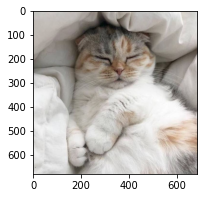

In [117]:
# 저해상도 이미지 불러오기
image = cv2.imread(os.getenv('HOME') + '/aiffel/super_resolution/1234.JPG')
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

print(image.shape)

plt.figure(figsize=(6,3))
plt.imshow(image)

In [118]:
# SRGAN으로 고해상도 이미지 생성
srgan_hr = apply_srgan(image)

In [119]:
# bicubic interpolation으로 이미지 사이즈 키우기
bicubic_hr = cv2.resize(
    image, 
    dsize=(image.shape[1]*4, image.shape[0]*4), # 고해상도 이미지 크기로 설정
    interpolation=cv2.INTER_CUBIC # bicubic 설정
)

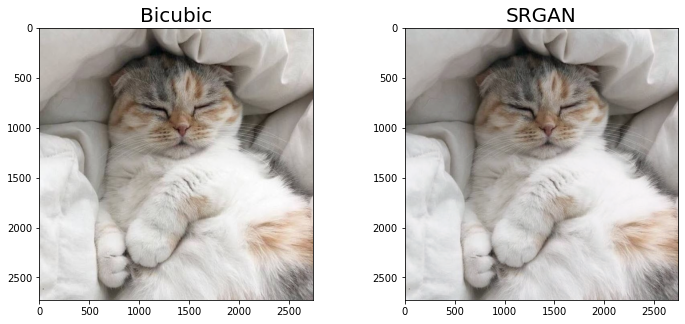

In [120]:
# 시각화
images = [bicubic_hr, srgan_hr]
titles = ["Bicubic", "SRGAN"]

plt.figure(figsize=(12,5))
for i, (image, title) in enumerate(zip(images, titles)):
    plt.subplot(1,2,i+1)
    plt.imshow(image)
    plt.title(title, fontsize=20)

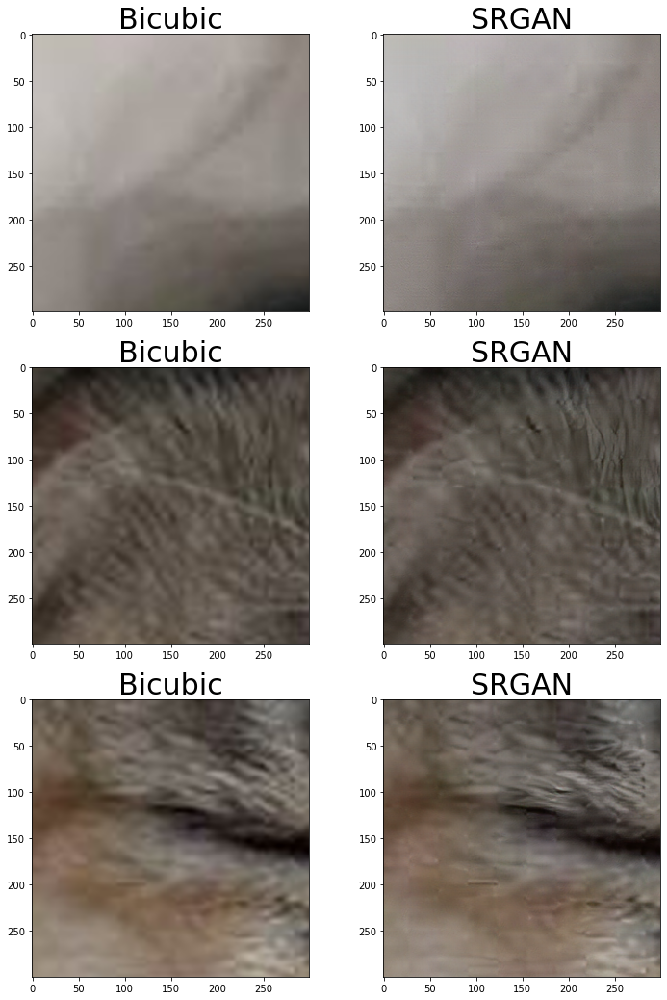

In [121]:
left_tops = [(0,700), (380,800), (650,900)]

images = []
for left_top in left_tops:
    img1 = crop(bicubic_hr, left_top, 300, 300)
    img2 = crop(srgan_hr , left_top, 300, 300)
    images.extend([img1, img2])

labels = ["Bicubic", "SRGAN"] * 3

plt.figure(figsize=(12,18))
for i in range(6):
    plt.subplot(3,2,i+1) 
    plt.imshow(images[i])
    plt.title(labels[i], fontsize=30)

- 확실하게 비교가 되지는 않지만, 털의 질감을 봤을때 뭔가 자세하게 표현된듯이 보인다.(다소 미세한 차이....)

## 프로젝트 2

In [122]:
gif_path = "./wine_lr.gif"
gif = cv2.VideoCapture(gif_path)

isTrue = True
frames = []
while isTrue:
    isTrue, frame = gif.read()
    if isTrue:
        frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
        frames.append(frame)

print("frame 수 :", len(frames))
print("frame 크기 :", (frames[0].shape))

frame 수 : 8
frame 크기 : (255, 500, 3)


In [123]:
# Bicubic interpolation
Bicubic_frames = []
for frame in frames:
    bc = cv2.resize(
        frame,
        dsize = (frame.shape[1]*4, frame.shape[0]*4),
        interpolation = cv2.INTER_CUBIC
    )
    Bicubic_frames.append(bc)

In [124]:
frames_sr = []
for frame in frames:
    srgan_frame = apply_srgan(frame)
    frames_sr.append(srgan_frame)

In [125]:
import imageio

imageio.mimsave("bicubic.gif", Bicubic_frames)
imageio.mimsave("srgan.gif", frames_sr)

In [126]:
from IPython.display import Image as show_gif

## wine

- bicubic

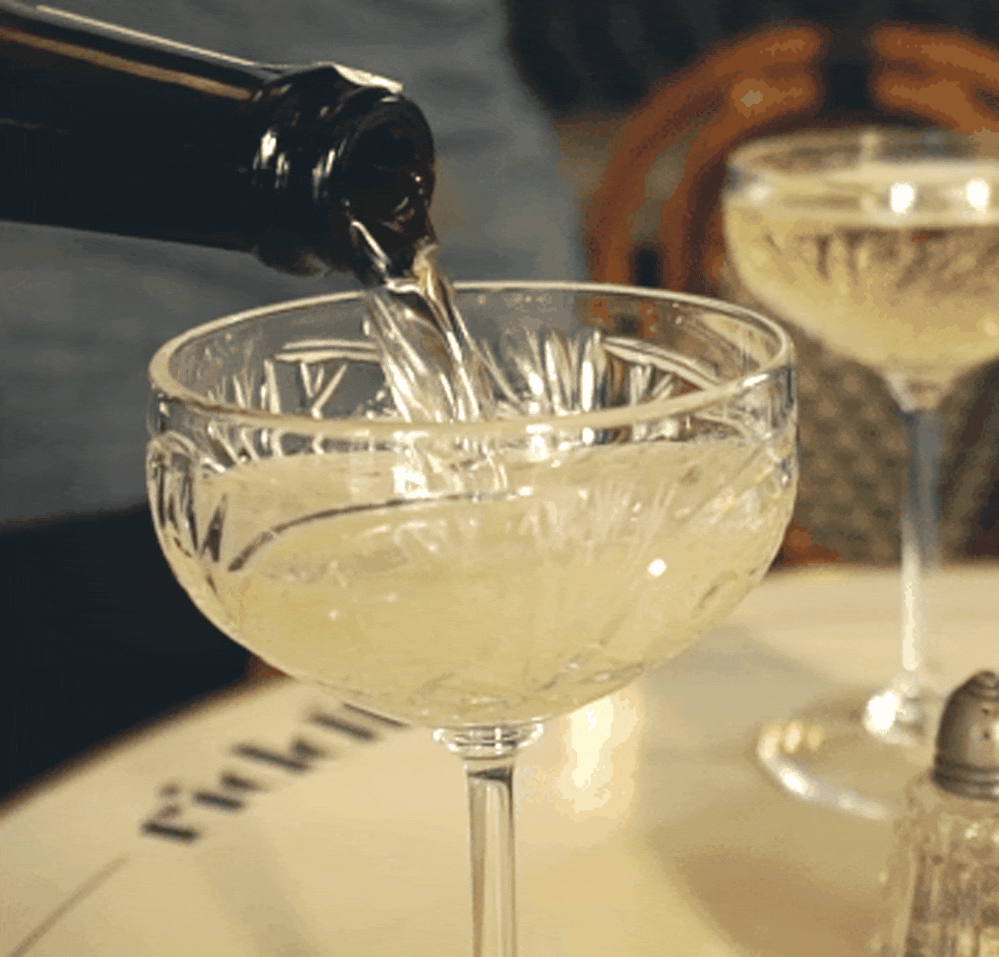

- srgan

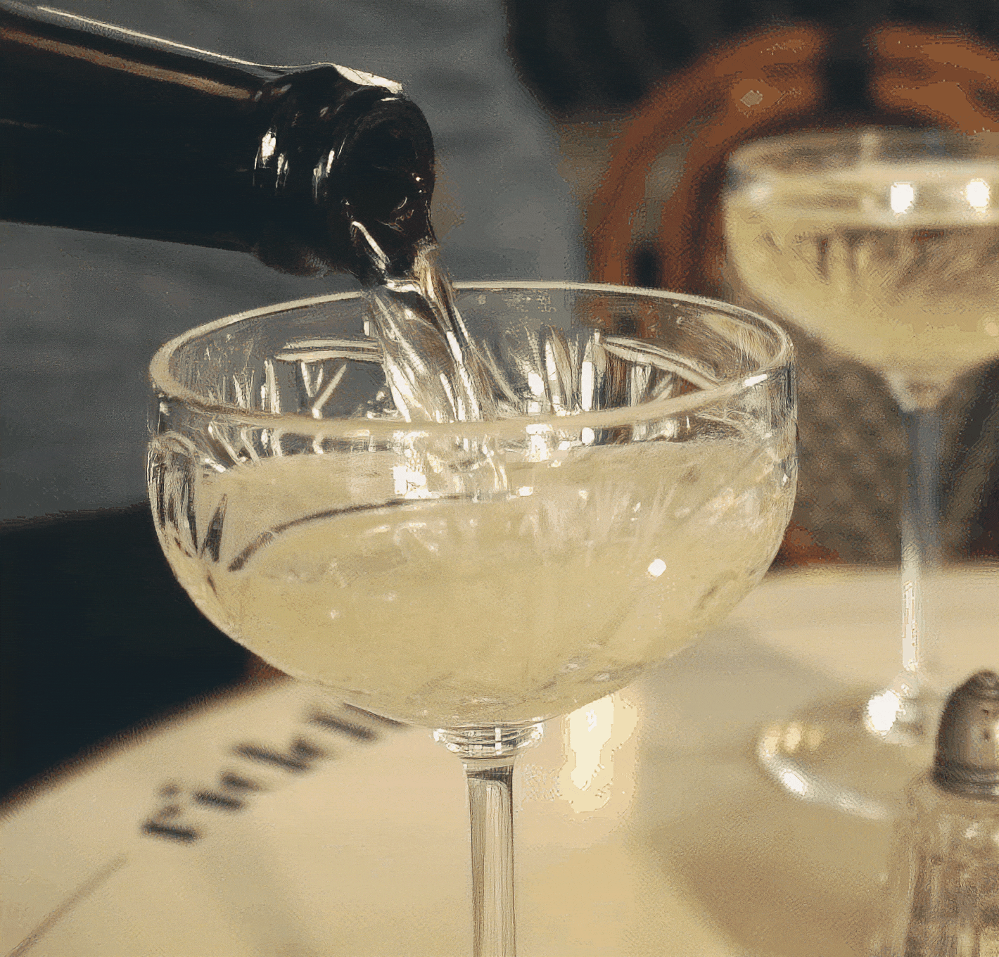

 ***wine을 비교 했을때 확실하게 자세히 표현되려고 하는 모습이 보인다. 제일 처음 사진과, 다른 gif 사진들도 해봤지만, 용량이 너무 커서 wine만 올렸고, 확실히 개선되는 모습들을 볼 수 있었다. 특히, 모서리 부분(선으로 된)들이 개선되었다.***

*********************
## 회고

- 고화질로 높이기 위해서는 많은 시간이 필요하고, 그만큼 용량이 굉장히 커지기 때문에 관리를 잘해야한다고 생각들었다.
- Super Resolution을 통해 짧은 시간동안 눈으로 확인 가능한 결과를 볼 수 있어서 재밌었다.
- 사진을 어떤 사진을 썼느냐에 따라 결과가 달라지는것이 개선해야할 점이라고 생각한다. 어떤 환경이든 같은 좋은 결과를 볼 수 있도록 알아보겠다.